# Week 5B: More Geospatial Analysis: Raster Data

- Section 401
- Wednesday October 4, 2023

In [2]:
# Our usual imports
import altair as alt
import geopandas as gpd
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

In [3]:
# This will add the .hvplot() function to your DataFrame!
# Import holoviews too
import holoviews as hv
import hvplot.pandas

hv.extension("bokeh")

## We've already worked with *raster* data

- So far we've been working mainly with *vector* data using geopandas: lines, points, polygons
- The basemap tiles we've been adding to our `hvplot` maps are an exampe of *raster* data
- **Raster data:**
    - Gridded or pixelated
    - Maps easily to an array — it's the representation for digital images

<img src="imgs/raster-intro.png" width=800></img>

## Continuous raster examples

- Multispectral satellite imagery, e.g., the Landsat satellite
- Digital Elevation Models (DEMs)
- Maps of canopy height derived from LiDAR data.

## Categorical raster examples

- Land cover or land-use maps.
- Tree height maps classified as short, medium, and tall trees.
- Snowcover masks (binary snow or no snow)

## Important attributes of raster data

### 1. The coordinate reference system 

![](imgs/raster-crs.jpeg)

### 2. Resolution

The spatial distance that a single pixel covers on the ground.

![](imgs/raster-resolution.png)

### 3. Extent

The bounding box that covers the entire extent of the raster data.

<img src="imgs/raster-extent.png" width=700></img>

<img src="imgs/raster-extent-2.png" width=700></img>

### 4. Affine transformation

Transfrom from *pixel space* to *real space*

- A mapping from pixel space (rows and columns of the image) to the x and y coordinates defined by the CRS
- Typically a six parameter matrix defining the origin, pixel resolution, and rotation of the raster image

## Multi-band raster data

Each band measures the light reflected from different parts of the electromagnetic spectrum. 

![](imgs/multi-band-raster.png)

Color images are multi-band rasters!

<img src="imgs/color-images.png" width="800"></img>

## The raster format: GeoTIFF

- A standard `.tif` image format with additional spatial information embedded in the file, which includes metadata for: 
    - Geotransform, e.g., extent, resolution
    - Coordinate Reference System (CRS)
    - Values that represent missing data (`NoDataValue`)

## Tools for raster data 

- Lots of different options: really just working with *arrays*
- One of the first options: Geospatial Data Abstraction Library (GDAL)
    - Low level and not really user-friendly
- A more recent, much more Pythonic package: `rasterio`

We'll use `rasterio` for the majority of our raster analysis

::: {.callout-note title="Raster data + NumPy"}

Multi-band raster data is best represented as multi-dimensional arrays. In Python, that means working with NumPy arrays. We'll work primarily with rasterio today but see a few examples of NumPy arrays.

To learn more about NumPy, we recommend going through the 
[DataCamp course on NumPy](https://www.datacamp.com/courses/introduction-to-numpy). To get free access to DataCamp, see [the instructions](https://musa-550-fall-2023.github.io/resource/python.html#datacamp-courses) on the course website.

:::

## Part 1: Getting started with rasterio

Analysis is built around the "open()" command which returns a "dataset" or "file handle"

In [4]:
import rasterio as rio

In [5]:
# Open the file and get a file "handle"
landsat = rio.open("./data/landsat8_philly.tif")

landsat

<open DatasetReader name='./data/landsat8_philly.tif' mode='r'>

### Let's check out the metadata


In [6]:
# The CRS
landsat.crs

CRS.from_epsg(32618)

In [7]:
# The bounds
landsat.bounds

BoundingBox(left=476064.3596176505, bottom=4413096.927074196, right=503754.3596176505, top=4443066.927074196)

In [8]:
# The number of bands available
landsat.count

10

In [9]:
# The band numbers that are available
landsat.indexes

(1, 2, 3, 4, 5, 6, 7, 8, 9, 10)

In [10]:
# Number of pixels in the x and y directions
landsat.shape

(999, 923)

In [11]:
# The 6 parameters that map from pixel to real space
landsat.transform

Affine(30.0, 0.0, 476064.3596176505,
       0.0, -30.0, 4443066.927074196)

In [12]:
# All of the meta data
landsat.meta

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': None,
 'width': 923,
 'height': 999,
 'count': 10,
 'crs': CRS.from_epsg(32618),
 'transform': Affine(30.0, 0.0, 476064.3596176505,
        0.0, -30.0, 4443066.927074196)}

### Reading data from a file

Tell the file which band to read, **starting with 1**

In [13]:
# This is a NumPy array!
data = landsat.read(1)

data

array([[10901, 10618, 10751, ..., 12145, 11540, 14954],
       [11602, 10718, 10546, ..., 11872, 11982, 12888],
       [10975, 10384, 10357, ..., 11544, 12318, 12456],
       ...,
       [12281, 12117, 12072, ..., 11412, 11724, 11088],
       [12747, 11866, 11587, ..., 11558, 12028, 10605],
       [11791, 11677, 10656, ..., 10615, 11557, 11137]], dtype=uint16)

### Plotting with imshow

We can plot it with matplotlib's `imshow`

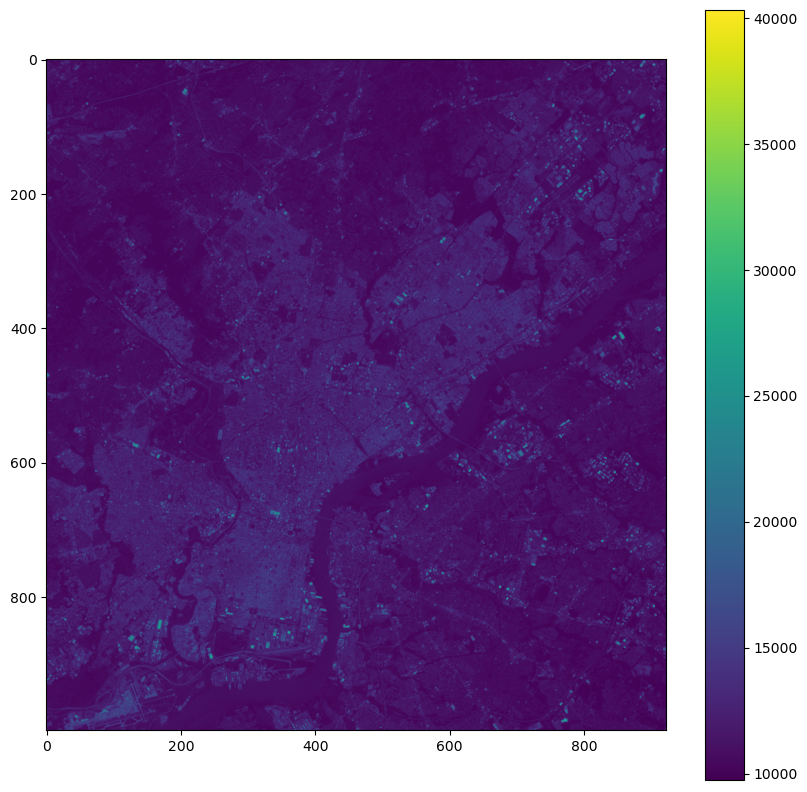

In [14]:
fig, ax = plt.subplots(figsize=(10, 10))

img = ax.imshow(data)

plt.colorbar(img);

### Two improvements

- A log-scale colorbar
- Add the axes extent

#### 1. Adding the axes extent

Note that imshow needs a bounding box of the form: `(left, right, bottom, top).` 


See the documentation for `imshow` if you forget the right ordering...(I often do!)

#### 2. Using a log-scale color bar

Matplotlib has a built in log normalization...

In [15]:
import matplotlib.colors as mcolors

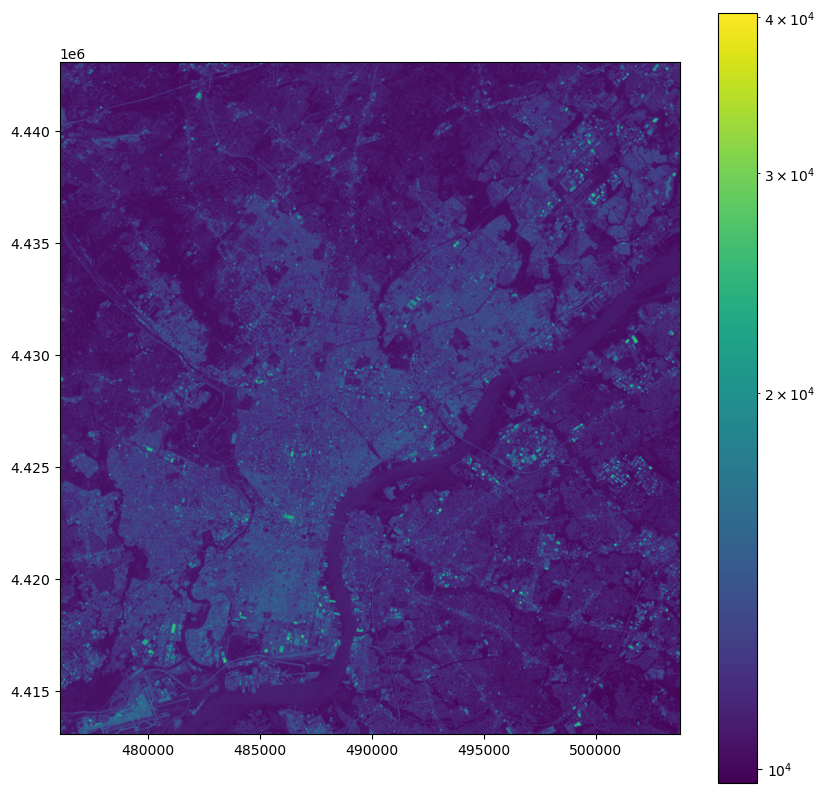

In [16]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the image
img = ax.imshow(
    data,
    # Use a log colorbar scale
    norm=mcolors.LogNorm(),
    # Set the extent of the images
    extent=[
        landsat.bounds.left,
        landsat.bounds.right,
        landsat.bounds.bottom,
        landsat.bounds.top,
    ],
)

# Add a colorbar
plt.colorbar(img);

### Overlaying vector geometries on raster plots

Two requirements:

1. The CRS of the two datasets must match
1. The extent of the imshow plot must be set properly

#### Example: Let's add the city limits

In [17]:
city_limits = gpd.read_file("./data/City_Limits.geojson")

In [18]:
# Convert to the correct CRS!
print(landsat.crs.data)

{'init': 'epsg:32618'}


In [19]:
city_limits = city_limits.to_crs(landsat.crs.data["init"])

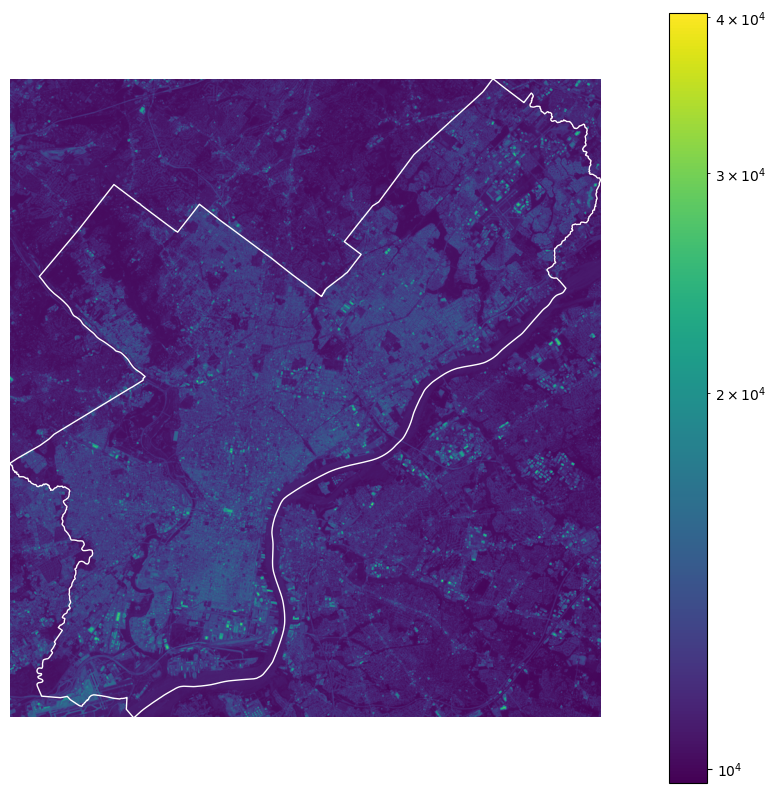

In [20]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# The extent of the data
landsat_extent = [
    landsat.bounds.left,
    landsat.bounds.right,
    landsat.bounds.bottom,
    landsat.bounds.top,
]

# Plot!
img = ax.imshow(data, norm=mcolors.LogNorm(), extent=landsat_extent)  # NEW  # NEW

# Add the city limits
city_limits.plot(ax=ax, facecolor="none", edgecolor="white")

# Add a colorbar and turn off axis lines
plt.colorbar(img)
ax.set_axis_off()

**But wait...** What band did we plot??

Landsat 8 has 11 bands spanning the electromagnetic spectrum from visible to infrared. 

<img src="imgs/landsat-bands.png" width="700"></img>

### How about a typical RGB color image?

First let's read the red, blue, and green bands (bands 4, 3, 2):

::: {.callout-note}

The `.indexes` attributes tells us the bands available to be read.

**Important:** they are **NOT** zero-indexed! 

:::

In [21]:
landsat.indexes

(1, 2, 3, 4, 5, 6, 7, 8, 9, 10)

In [22]:
rgb_data = landsat.read([4, 3, 2])

In [23]:
rgb_data.shape

(3, 999, 923)

Note the data has the shape: (bands, height, width)

In [24]:
data[0]

array([10901, 10618, 10751, 11045, 10914, 10400, 10585, 10438, 10225,
       10297, 10523, 10944, 10507, 10505, 10686, 11082, 11852, 11455,
       11293, 10536, 10315, 10391, 10472, 10366, 10341, 11422, 10582,
       11905, 12525, 12748, 13027, 13115, 12969, 12844, 12975, 11837,
       10618, 11009, 10945, 10653, 10519, 10594, 10546, 10580, 10768,
       10943, 10769, 10533, 10559, 10725, 10774, 11520, 11922, 11483,
       10478, 10390, 10283, 10345, 10280, 10343, 10536, 10332, 10422,
       10309, 10377, 10517, 10225, 10468, 10816, 10553, 10419, 10394,
       10619, 10734, 10841, 10944, 11099, 11107, 10857, 10738, 10814,
       10658, 10735, 10842, 10765, 10587, 10785, 10797, 11099, 11141,
       10923, 11064, 10626, 10355, 10499, 10530, 10641, 10466, 10497,
       10480, 11392, 11669, 10928, 10927, 10524, 10499, 10337, 10374,
       10670, 10630, 10371, 10211, 10268, 10275, 10296, 10244, 10216,
       10240, 10598, 10427, 10355, 10412, 10417, 10410, 10272, 10268,
       10373, 10320,

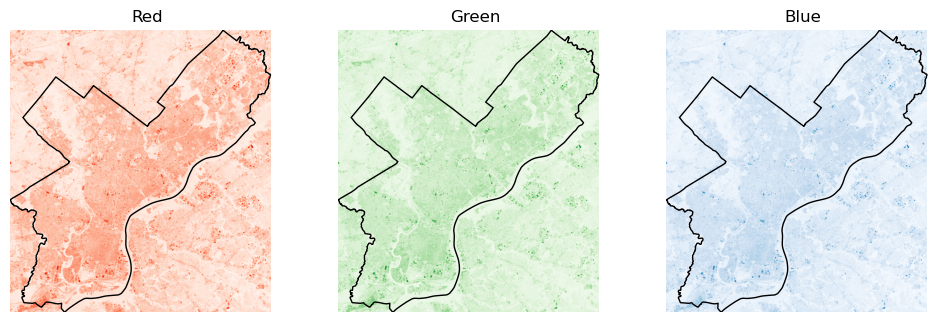

In [25]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 6))

cmaps = ["Reds", "Greens", "Blues"]
for i in [0, 1, 2]:
    # This subplot axes
    ax = axs[i]

    # Plot
    ax.imshow(rgb_data[i], norm=mcolors.LogNorm(), extent=landsat_extent, cmap=cmaps[i])
    city_limits.plot(ax=ax, facecolor="none", edgecolor="black")

    # Format
    ax.set_axis_off()
    ax.set_title(cmaps[i][:-1])

::: {.callout-tip}

# Side note: using subplots in matplotlib

You can specify the subplot layout via the `nrows` and `ncols` keywords to `plt.subplots`. If you have more than one row or column, the function returns: 
- The figure
- The **list of axes**.

:::

As an example:

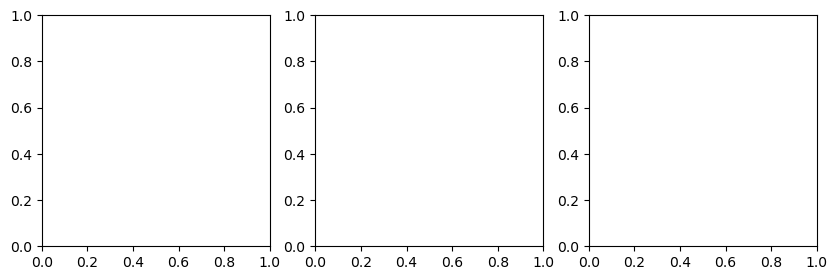

In [26]:
fig, axs = plt.subplots(figsize=(10, 3), nrows=1, ncols=3)

::: {.callout-note}

When `nrows` or `ncols` > 1, I usually name the returned axes variable "axs" vs. the usual case of just "ax". It's useful for remembering we got more than one Axes object back!

:::

In [27]:
# This has length 3 for each of the 3 columns!
axs

array([<Axes: >, <Axes: >, <Axes: >], dtype=object)

In [28]:
# Left axes
axs[0]

<Axes: >

In [29]:
# Middle axes
axs[1]

<Axes: >

In [30]:
# Right axes
axs[2]

<Axes: >

### Use `earthpy` to plot the combined color image

A useful utility package to perform the proper re-scaling of pixel values

In [32]:
import earthpy.plot as ep

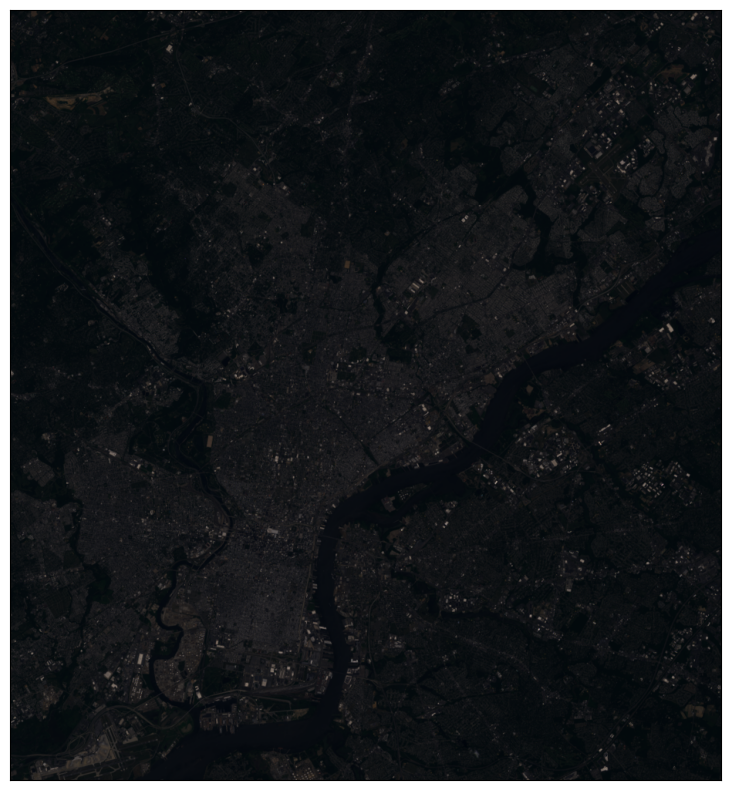

In [33]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the RGB bands
ep.plot_rgb(rgb_data, rgb=(0, 1, 2), ax=ax);

#### We can "stretch" the data to improve the brightness

<img src="imgs/earthpy-stretch.png" width="700"></img>

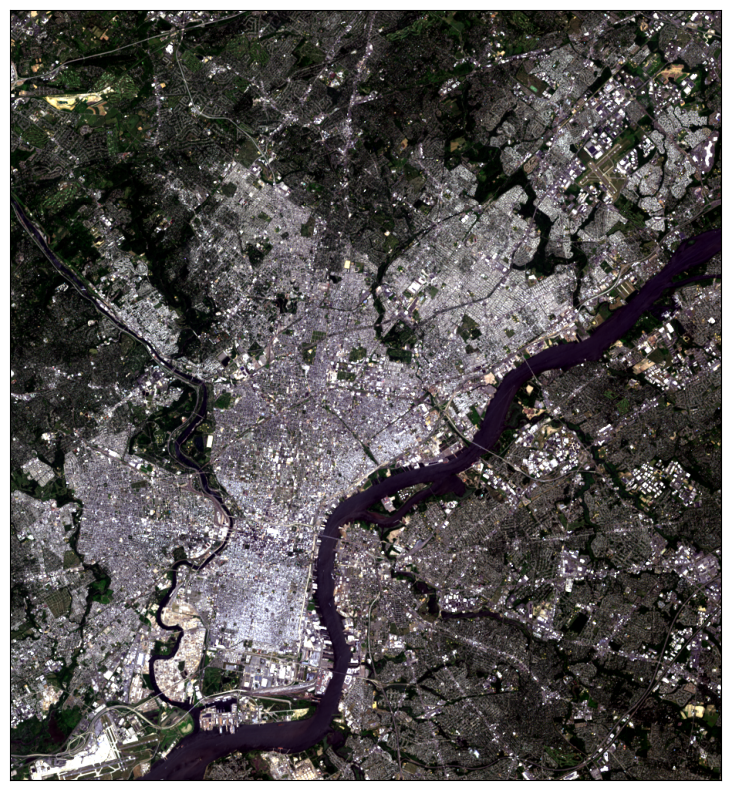

In [34]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the RGB bands
ep.plot_rgb(rgb_data, rgb=(0, 1, 2), ax=ax, stretch=True);

### Conclusion: Working with multi-band data via rasterio is a bit messy

Can we do better?

**Yes!**

HoloViz to the rescue...

The xarray package is an alternative way to work with raster data. It's not as well established as `rasterio` but has a lot of promising features...

<img src="imgs/xarray-logo.png" width="600"></img>

### A quick example with xarray

- A fancier version of NumPy arrays
- Designed for gridded data with multiple dimensions
- For raster data, those dimensions are: bands, latitude, longitude, pixel values

In [35]:
import rioxarray  # Adds rasterio engine extension to xarray
import xarray as xr

In [36]:
ds = xr.open_dataset("./data/landsat8_philly.tif", engine="rasterio")

ds

<xarray.Dataset>
Dimensions:      (band: 10, x: 923, y: 999)
Coordinates:
  * band         (band) int64 1 2 3 4 5 6 7 8 9 10
  * x            (x) float64 4.761e+05 4.761e+05 ... 5.037e+05 5.037e+05
  * y            (y) float64 4.443e+06 4.443e+06 ... 4.413e+06 4.413e+06
    spatial_ref  int64 ...
Data variables:
    band_data    (band, y, x) float32 ...

In [37]:
type(ds)

xarray.core.dataset.Dataset

### Now the magic begins: more hvplot

Still experimental, but very promising — interactive plots with widgets for each band!

In [38]:
import hvplot.xarray

In [39]:
img = ds.hvplot.image(width=700, height=500, cmap="viridis")

img

:DynamicMap   [band]
   :Image   [y,x]   (band_data)

More magic widgets from hvplot!

### That's it for xarray for now...


More coming in later weeks when we tackle advanced raster examples...

## Part 2: Two key raster concepts

- Combining vector + raster data
    - Cropping or masking raster data based on vector polygons
- Raster math and zonal statistics
    - Combining multiple raster data sets
    - Calculating statistics within certain vector polygons

### Cropping: let's trim to just the city limits

Use rasterio's builtin `mask()` function:

In [40]:
from rasterio.mask import mask

In [41]:
landsat

<open DatasetReader name='./data/landsat8_philly.tif' mode='r'>

In [42]:
masked, mask_transform = mask(
    dataset=landsat,              # The original raster data
    shapes=city_limits.geometry,  # The vector geometry we want to crop by
    crop=True,                    # Optional: remove pixels not within boundary
    all_touched=True,             # Optional: get all pixels that touch the boudnary
    filled=False,                 # Optional: do not fill cropped pixels with a default value
)

In [43]:
masked

masked_array(
  data=[[[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --]],

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --]],

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --]],

        ...,

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --,

In [44]:
masked.shape

(10, 999, 923)

Let's plot the masked data:

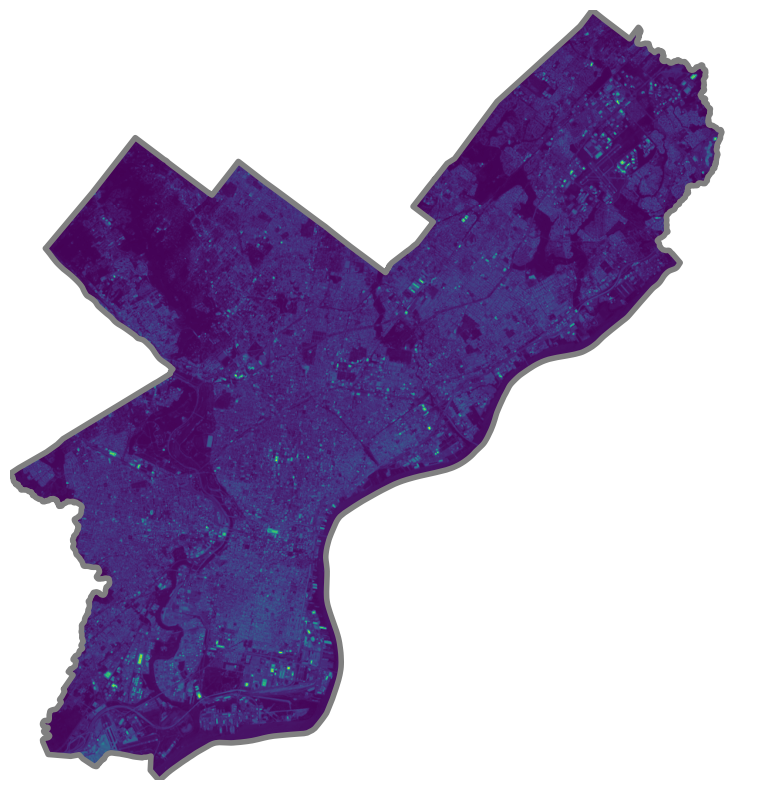

In [45]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the first band
ax.imshow(masked[0], cmap="viridis", extent=landsat_extent)

# Format and add the city limits
city_limits.boundary.plot(ax=ax, color="gray", linewidth=4)
ax.set_axis_off()

### Writing GeoTIFF files

Let's save our cropped raster data. To save raster data, we need both the array of the data and the proper meta-data. 

In [46]:
# The original meta dict
out_meta = landsat.meta

# Call dict.update() to add new key/value pairs
out_meta.update(
    {"height": masked.shape[1], "width": masked.shape[2], "transform": mask_transform}
)

# Print out new meta
print(out_meta)

# Write small image to local Geotiff file
with rio.open("data/cropped_landsat.tif", "w", **out_meta) as dst:
    dst.write(masked)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 923, 'height': 999, 'count': 10, 'crs': CRS.from_epsg(32618), 'transform': Affine(30.0, 0.0, 476064.3596176505,
       0.0, -30.0, 4443066.927074196)}


In [47]:
# Note: dst is now closed — we can't access it any more!
dst

<closed DatasetWriter name='data/cropped_landsat.tif' mode='w'>

::: {.callout-note}

We used a *context manager* above (the "with" statement) to handle the opening and subsequent closing of our new file.

For more info, see [this tutorial](https://www.pythontutorial.net/advanced-python/python-context-managers/).

:::

### Now, let's do some raster math

Often called "map algebra"...

### The Normalized Difference Vegetation Index

- A normalized index of greenness ranging from -1 to 1, calculated from the red and NIR bands. 
- Provides a measure of the amount of live green vegetation in an area

**Formula:**

NDVI = (NIR - Red) / (NIR + Red)

**How to intepret:** Healthy vegetation reflects NIR and absorbs visible, so the NDVI for green vegatation is +1

#### Get the data for the red and NIR bands

NIR is band 5 and red is band 4

In [48]:
masked.shape

(10, 999, 923)

In [49]:
# Note that the indexing here is zero-based, e.g., band 1 is index 0
red = masked[3]
nir = masked[4]

In [50]:
# Where mask = True, pixels are excluded
red.mask

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [51]:
def calculate_NDVI(nir, red):
    """
    Calculate the NDVI from the NIR and red landsat bands
    """

    # Convert to floats
    nir = nir.astype(float)
    red = red.astype(float)

    # Get valid entries
    check = np.logical_and(red.mask == False, nir.mask == False)

    # Where the check is True, return the NDVI, else return NaN
    ndvi = np.where(check, (nir - red) / (nir + red), np.nan)
    
    # Return
    return ndvi

In [1]:
NDVI = calculate_NDVI(nir, red)

NameError: name 'calculate_NDVI' is not defined

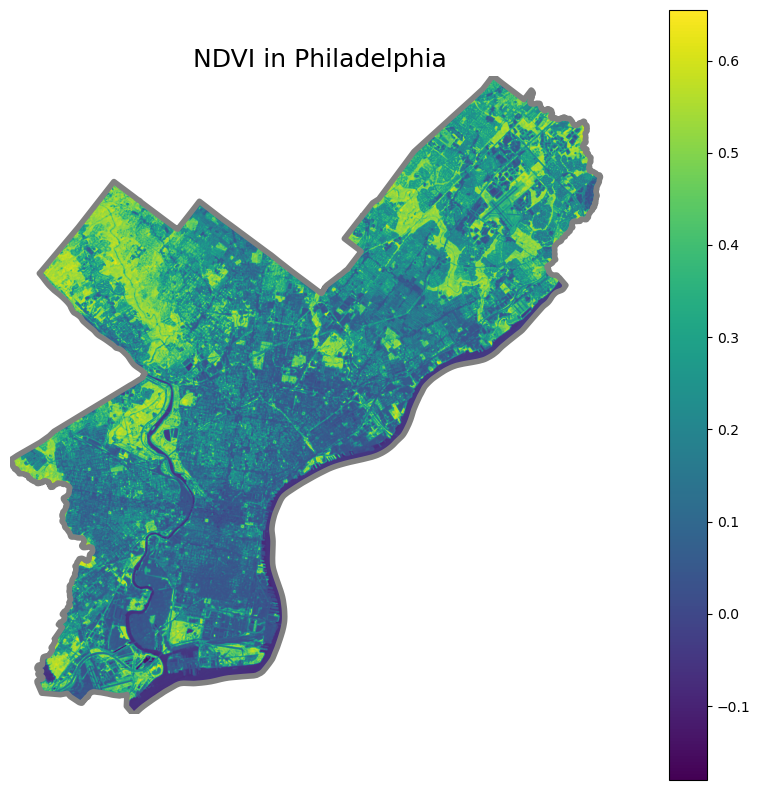

In [53]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot NDVI
img = ax.imshow(NDVI, extent=landsat_extent)

# Format and plot city limits
city_limits.plot(ax=ax, edgecolor="gray", facecolor="none", linewidth=4)
plt.colorbar(img)
ax.set_axis_off()
ax.set_title("NDVI in Philadelphia", fontsize=18);

#### Let's overlay Philly's parks

In [54]:
# Read in the parks dataset
parks = gpd.read_file("./data/parks.geojson")

**Important:** make sure you convert to the same CRS as the Landsat data!

In [55]:
# Print out the CRS
parks.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [56]:
landsat.crs

CRS.from_epsg(32618)

In [57]:
landsat.crs.data["init"]

'epsg:32618'

In [58]:
# Convert to landsat CRS
parks = parks.to_crs(landsat.crs.data["init"])

# Same as: parks = parks.to_crs(epsg=32618)

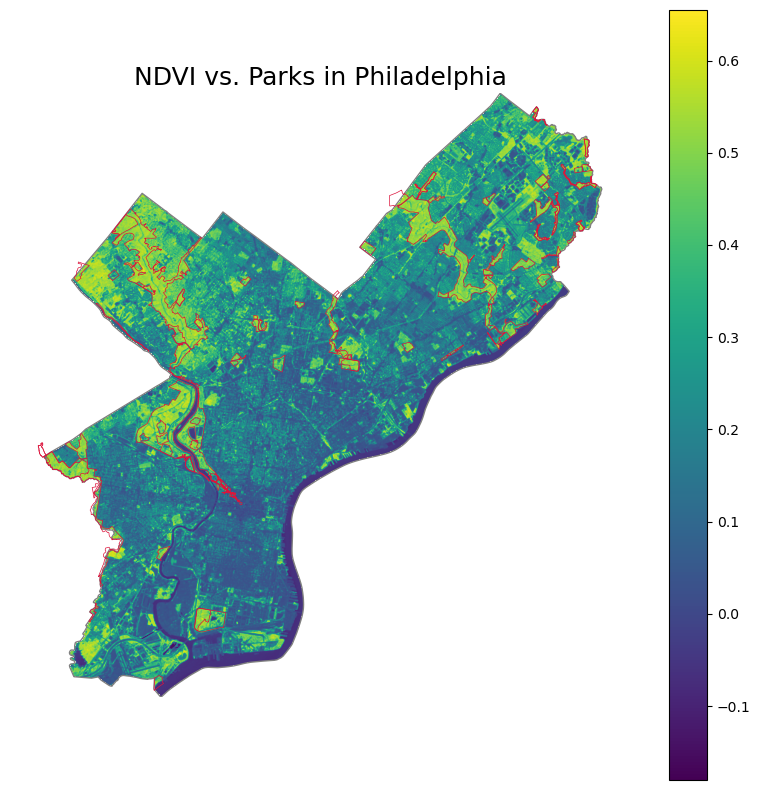

In [60]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot NDVI
img = ax.imshow(NDVI, extent=landsat_extent)

# Add the city limits
city_limits.plot(ax=ax, edgecolor="gray", facecolor="none", linewidth=1)

# NEW: add the parks
parks.plot(ax=ax, edgecolor="crimson", facecolor="none", linewidth=0.5)

# Format and add colorbar
plt.colorbar(img)
ax.set_axis_off()
ax.set_title("NDVI vs. Parks in Philadelphia", fontsize=18);

It looks like it worked pretty well!

### How about calculating the median NDVI within the park geometries?

This is called *zonal statistics*. We can use the `rasterstats` package to do this...

In [61]:
from rasterstats import zonal_stats

In [62]:
stats = zonal_stats(
    parks,  # The vector data
    NDVI,  # The array holding the raster data
    affine=landsat.transform,  # The affine transform for the raster data
    stats=["mean", "median"],  # The stats to compute
    nodata=np.nan,  # Missing data representation
)

#### The `zonal_stats` function

Zonal statistics of raster values aggregated to vector geometries.

- First argument: vector data
- Second argument: raster data to aggregated
- Also need to pass the affine transform and the names of the stats to compute

In [63]:
stats

[{'mean': 0.5051087300747117, 'median': 0.521160491292894},
 {'mean': 0.441677258928841, 'median': 0.47791901454593105},
 {'mean': 0.4885958179164529, 'median': 0.5084981442485412},
 {'mean': 0.3756264171005127, 'median': 0.42356277391080177},
 {'mean': 0.45897667566035816, 'median': 0.49204860985900256},
 {'mean': 0.4220467885671325, 'median': 0.46829433706341134},
 {'mean': 0.38363107808041097, 'median': 0.416380868090128},
 {'mean': 0.4330996771737791, 'median': 0.4772304906066629},
 {'mean': 0.45350534061220404, 'median': 0.5015001304461257},
 {'mean': 0.44505112880627273, 'median': 0.4701653486700216},
 {'mean': 0.5017048095513129, 'median': 0.5108644957689836},
 {'mean': 0.23745576631277313, 'median': 0.24259729272419628},
 {'mean': 0.31577818701756977, 'median': 0.3306512446567765},
 {'mean': 0.5300954792288528, 'median': 0.5286783042394015},
 {'mean': 0.4138823685577781, 'median': 0.4604562737642586},
 {'mean': 0.48518030764354636, 'median': 0.5319950233699855},
 {'mean': 0.315

In [64]:
len(stats)

63

In [65]:
len(parks)

63

The returned stats object is a list with one entry for each of the vector polygons (the parks dataset)

Let's extract out the median value the list of dictionaries:


In [66]:
median_stats = [s["median"] for s in stats]

Now, we can add it to the original parks GeoDataFrame as a new column:

In [67]:
# Store the median value in the parks data frame
parks["median_NDVI"] = median_stats

In [68]:
parks.head()

,OBJECTID,ASSET_NAME,SITE_NAME,CHILD_OF,ADDRESS,TYPE,USE_,DESCRIPTION,SQ_FEET,ACREAGE,ZIPCODE,ALLIAS,NOTES,TENANT,LABEL,DPP_ASSET_ID,Shape__Area,Shape__Length,geometry,median_NDVI
0,7,Wissahickon Valley Park,Wissahickon Valley Park,Wissahickon Valley Park,NaN,LAND,REGIONAL_CONSERVATION_WATERSHED,NO_PROGRAM,9.078309e+07,2084.101326,19128,,MAP,SITE,Wissahickon Valley Park,1357,1.441162e+07,71462.556702,"MULTIPOLYGON (((484101.476 4431051.989, 484099...",0.521160
1,8,West Fairmount Park,West Fairmount Park,West Fairmount Park,,LAND,REGIONAL_CONSERVATION_WATERSHED,NO_PROGRAM,6.078159e+07,1395.358890,19131,,MAP,SITE,West Fairmount Park,1714,9.631203e+06,25967.819064,"MULTIPOLYGON (((482736.681 4428824.579, 482728...",0.477919
2,23,Pennypack Park,Pennypack Park,Pennypack Park,,LAND,REGIONAL_CONSERVATION_WATERSHED,NO_PROGRAM,6.023748e+07,1382.867808,19152,Verree Rd Interpretive Center,MAP,SITE,Pennypack Park,1651,9.566914e+06,41487.394790,"MULTIPOLYGON (((497133.192 4434667.950, 497123...",0.508498
3,24,East Fairmount Park,East Fairmount Park,East Fairmount Park,,LAND,REGIONAL_CONSERVATION_WATERSHED,NO_PROGRAM,2.871642e+07,659.240959,19121,,MAP,SITE,East Fairmount Park,1713,4.549582e+06,21499.126097,"POLYGON ((484539.743 4424162.545, 484620.184 4...",0.423563
4,25,Tacony Creek Park,Tacony Creek Park,Tacony Creek Park,,LAND,REGIONAL_CONSERVATION_WATERSHED,NO_PROGRAM,1.388049e+07,318.653500,19120,,MAP,SITE,Tacony Creek Park,1961,2.201840e+06,19978.610852,"MULTIPOLYGON (((491712.882 4429633.244, 491713...",0.492049


#### Make a quick histogram of the median values

They are all positive, indicating an abundance of green vegetation...

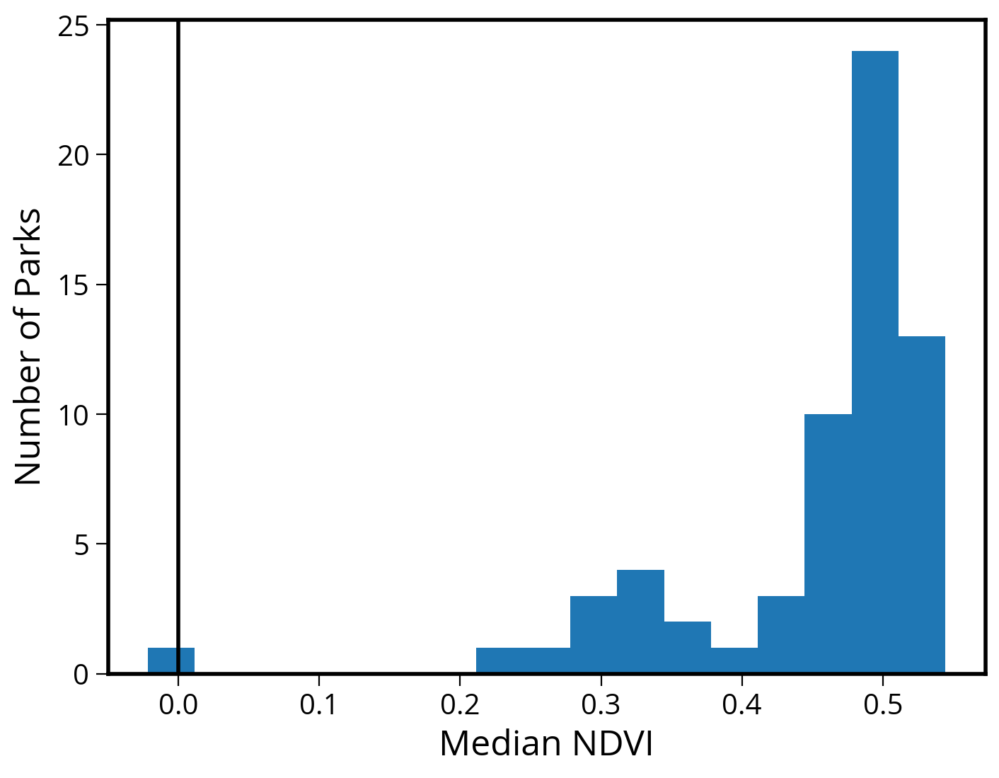

In [66]:
# Initialize
fig, ax = plt.subplots(figsize=(8, 6))

# Plot a quick histogram
ax.hist(parks["median_NDVI"], bins="auto")
ax.axvline(x=0, c="k", lw=2)

# Format
ax.set_xlabel("Median NDVI", fontsize=18)
ax.set_ylabel("Number of Parks", fontsize=18);

#### Let's make a choropleth, too

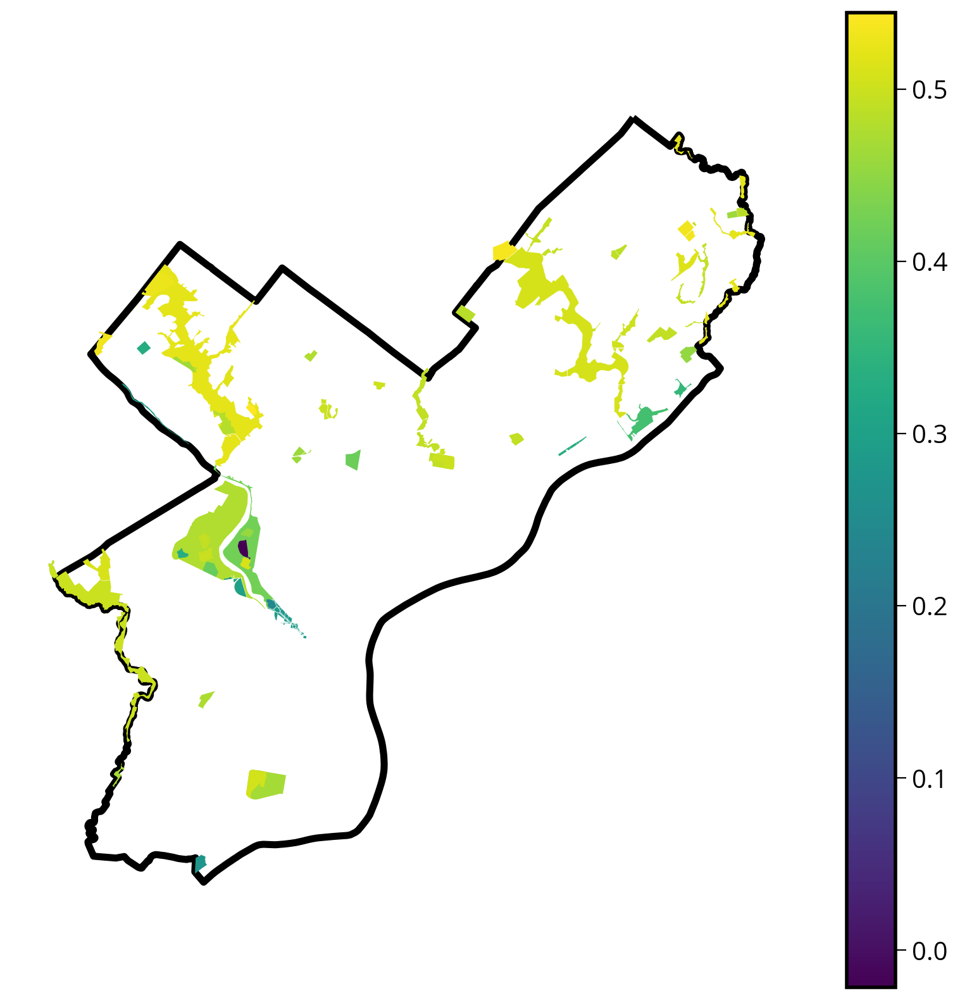

In [67]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the city limits
city_limits.plot(ax=ax, edgecolor="black", facecolor="none", linewidth=4)

# Plot the median NDVI
parks.plot(column="median_NDVI", legend=True, ax=ax, cmap="viridis")

# Format
ax.set_axis_off()

#### Let's make it interactive!

*Make sure to check the crs!*

In [68]:
parks.crs

<Projected CRS: EPSG:32618>
Name: WGS 84 / UTM zone 18N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 78°W and 72°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Canada - Nunavut; Ontario; Quebec. Colombia. Cuba. Ecuador. Greenland. Haiti. Jamaica. Panama. Turks and Caicos Islands. United States (USA). Venezuela.
- bounds: (-78.0, 0.0, -72.0, 84.0)
Coordinate Operation:
- name: UTM zone 18N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

::: {.callout-note}

The CRS is "EPSG:32618" and since it's not in 4326, we'll need to specify the "crs=" keyword when plotting!

:::

In [69]:
# trim to only the columns we want to plot
cols = ["median_NDVI", "SITE_NAME", "geometry"]

# Plot the parks colored by median NDVI
p = parks[cols].hvplot.polygons(
    c="median_NDVI", geo=True, crs=32618, cmap="viridis", hover_cols=["SITE_NAME"]
)

# Plot the city limit boundary
cl = city_limits.hvplot.polygons(
    geo=True,
    crs=32618,
    alpha=0,
    line_alpha=1,
    line_color="black",
    hover=False,
    width=700,
    height=600,
)

# combine!
cl * p

:Overlay
   .Polygons.I  :Polygons   [Longitude,Latitude]
   .Polygons.II :Polygons   [Longitude,Latitude]   (median_NDVI,SITE_NAME)

## Exercise: Measure the median NDVI for each of Philadelphia's neighborhoods

- Once you measure the median value for each neighborhood, try making the following charts:
    - A histogram of the median values for all neighborhoods
    - Bar graphs with the neighborhoods with the 20 highest and 20 lowest values
    - A choropleth showing the median values across the city
    
You're welcome to use matplotlib/geopandas, but encouraged to explore the new hvplot options!

### 1. Load the neighborhoods data

- A GeoJSON file of Philly's neighborhoods is available in the "data/" folder

### 2. Calculate the median NDVI value for each neighborhood

::: {.callout-warning title="Important"}

Make sure your neighborhoods GeoDataFrame is in the same CRS as the Landsat data!

:::

###  3. Make a histogram of median values

### 4. Plot a (static) choropleth map

### 5. Plot an (interactive) choropleth map


You can use your favorite library: hvplot, altair, or geopandas. Solutions will include examples of all three!

#### With hvplot

#### With altair

### 6. Challenges

A few extra analysis pieces as an extra challenge. Let's explore the neighborhoods with the highest and lowest median NDVI values.

#### 6A. Plot a bar chart of the neighborhoods with the top 20 largest median values

#### 6B. Plot a bar chart of the neighborhoods with the bottom 20 largest median values

## That's it!

- Coming up next: moving on to our "getting data" modules with APIs and web scraping
- See you on Monday!